In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

In [3]:
def map_make(scale,box,xstep,ystep):
    ax=plt.axes(projection=ccrs.PlateCarree(central_longitude=180))
    a = (box[1]-box[0])//xstep
    x_start = box[1] - a*xstep
    a = (box[3]-box[2])//ystep
    y_start = box[3] - a*ystep
    ax.set_extent(box,crs=ccrs.PlateCarree())
    #ax.add_feature(cfeature.LAKES.with_scale(scale))
    #ax.add_feature(cfeature.OCEAN.with_scale(scale))
    #ax.add_feature(cfeature.RIVERS.with_scale(scale))
    #ax.add_feature(cfeature.LAND.with_scale(scale),lw=0.5)
    ax.add_feature(cfeature.COASTLINE.with_scale(scale),lw=2)
    
    ax.set_xticks(np.arange(x_start,box[1]+xstep,xstep), crs=ccrs.PlateCarree())
    ax.set_yticks(np.arange(y_start,box[3]+ystep,ystep), crs=ccrs.PlateCarree())
    #zero_direction_label用来设置经度的0度加不加E和W
    lon_formatter = LongitudeFormatter(zero_direction_label=False)
    lat_formatter = LatitudeFormatter()
    ax.xaxis.set_major_formatter(lon_formatter)
    ax.yaxis.set_major_formatter(lat_formatter)
    #添加网格线
    ax.grid()
    
    ax.outline_patch.set_visible(False)
    ax.spines['bottom'].set_visible(True)
    ax.spines['left'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_linewidth(2.5);###设置底部坐标轴的粗细
    ax.spines['left'].set_linewidth(2.5);####设置左边坐标轴的粗细
    ax.spines['right'].set_linewidth(2.5);###设置右边坐标轴的粗细
    ax.spines['top'].set_linewidth(2.5);####设置上部坐标轴的粗细
    
    return ax


/opt/anaconda3/envs/pyn_env/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:704: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  self.set_xlim([x1, x2])
/opt/anaconda3/envs/pyn_env/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:782: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_xticks(xticks, minor)
/opt/anaconda3/envs/pyn_env/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:829: MatplotlibDeprecationWarning: Passing the minor parameter of set_ticks() positionally is deprecated since Matplotlib 3.2; the parameter will become keyword-only two minor releases later.
  return super(GeoAxes, self).set_yticks(yticks, minor)
/opt/anaconda3/envs/pyn_env/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:387: MatplotlibDeprecationWarning

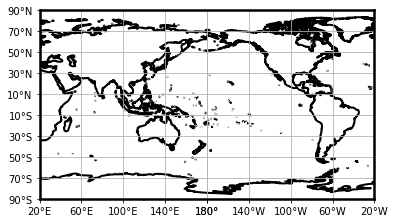

In [4]:
box=[-180,180,-90,90]
ax=map_make(scale='50m',box=box,xstep=40,ystep=20)

In [ ]:
# wget https://topex.ucsd.edu/CGM/01_GPS/wus_gps_final_names.dat



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Download the GPS velocity field from
# https://topex.ucsd.edu/CGM/01_GPS/wus_gps_final_names.dat
velo = np.genfromtxt('wus_gps_final_names.dat', usecols=range(1, 5),
                     names=('lat', 'lon', 'Vn', 'Ve'), skip_header=1)
# Coordinates of Los Angeles & San Francisco
l_a, s_f = (-118.30, 34.12), (-122.43, 37.74)

fig = plt.figure(figsize=(12, 12))
# Set projection
ax = plt.axes(projection=ccrs.Miller(central_longitude=-120))
# Add ocean, land, rivers, lakes & boundary of states
ax.add_feature(cfeature.OCEAN.with_scale('50m'))
ax.add_feature(cfeature.LAND.with_scale('50m'))
ax.add_feature(cfeature.RIVERS.with_scale('50m'))
ax.add_feature(cfeature.LAKES.with_scale('50m'))
ax.add_feature(cfeature.STATES.with_scale('50m'))
# Plot quivers
qs = ax.quiver(velo['lon'], velo['lat'], velo['Ve'], velo['Vn'], width=0.0015,
               scale_units='inches', scale=85, color='darkred',
               transform=ccrs.PlateCarree())
# Plot a legend for quiver
ax.quiverkey(qs, 0.04, 0.1, 20, '20 mm/yr', labelpos='E')
# Plot Los Angeles & San Francisco, as reference
ax.scatter(s_f[0], s_f[1], s=90, label='San Francisco', color='darkcyan',
           transform=ccrs.Geodetic())
ax.scatter(l_a[0], l_a[1], s=210, label='Los Angeles', color='olivedrab',
           transform=ccrs.Geodetic())
ax.legend(loc='lower left')
# Plot grid lines
ax.gridlines(linestyle='--')
ax.set_extent([-126, -113, 32, 40])

plt.show()

In [ ]:
# https://scitools.org.uk/cartopy/docs/latest/

# projections-10.py
plt.figure(figsize=(3, 3))
ax = plt.axes(projection=ccrs.Orthographic())
ax.coastlines(resolution='10m')
ax.gridlines()




In [ ]:
# test
for i in range(10):
    # print("projections-"+str(i)+".py")
    tmp="projections-"+str(i)+".py"
    print(tmp)
    %run 




In [ ]:

%run projections-11.py

projections-9.py


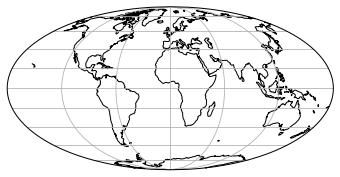

In [101]:
a="projections-9.py"
%run $a 
!echo $a

projections-1.py
projections-2.py
projections-3.py
projections-4.py
projections-5.py
projections-6.py
projections-7.py
projections-8.py
projections-9.py
projections-10.py


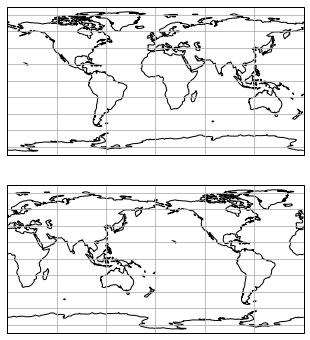

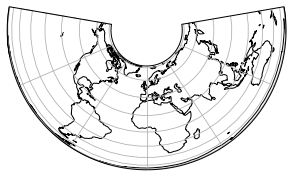

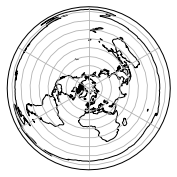

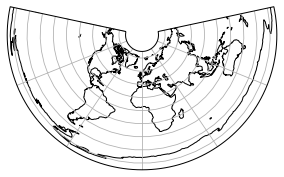

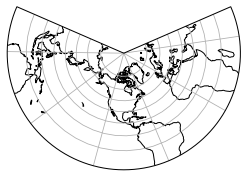

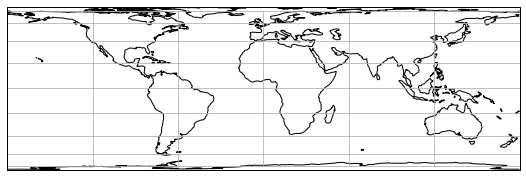

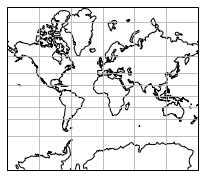

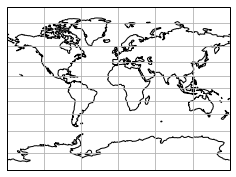

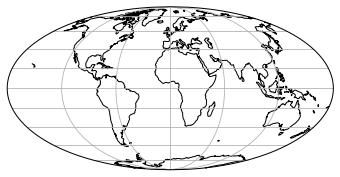

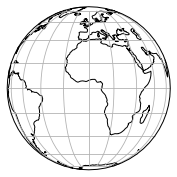

projections-11.py
projections-12.py
projections-13.py
projections-14.py
projections-15.py
projections-16.py
projections-17.py
projections-18.py
projections-19.py
projections-20.py
projections-21.py
projections-22.py
projections-23.py
projections-24.py
projections-25.py
projections-26.py
projections-27.py
projections-28.py
projections-29.py
projections-30.py
projections-31.py
projections-32.py
projections-33.py


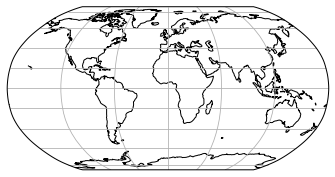

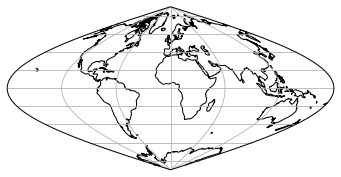

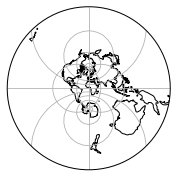

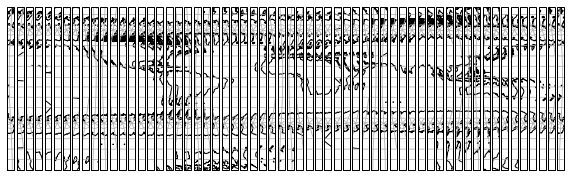

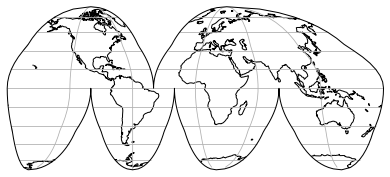

...

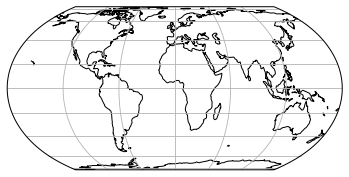

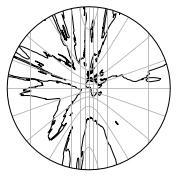

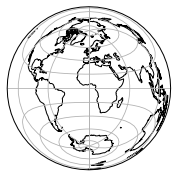

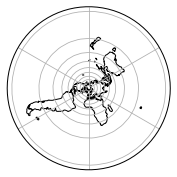

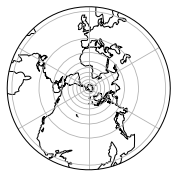

In [114]:

# !ls
# %run projections-9.py
# %magic

#魔术命令： https://blog.csdn.net/qq_29831163/article/details/90488432

for i in range(1,34,1):
    tmp="projections-"+str(i)+".py"
    !echo $tmp
    if i in [14,18,32] :
        i=++i
    else: 
        %run $tmp


In [ ]:
# https://blog.csdn.net/u013358302/article/details/51436079?utm_source=blogxgwz3
for i in range(10): 
    print(i)

In [ ]:
for i in range(2): 
    s = "dir%s" % i 
    !mkdir $s